In [1]:
# Import libraries
import numpy as np
import pandas as pd
import json
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import gridspec
from matplotlib.patches import Patch
from scipy.signal import savgol_filter
from unityvr.preproc import logproc
from unityvr.viz import viz
from unityvr.viz.utils import myAxisTheme

In [3]:
def run_analysis_for_trial(rootDir, flyID, trial_folder):
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Define directories
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    dataDir = os.path.join(rootDir, 'raw', flyID, trial_folder)
    preprocDir = os.path.join(rootDir, 'preproc', flyID, trial_folder)
    plotDir = os.path.join(rootDir, 'plot', flyID, trial_folder)

    os.makedirs(preprocDir, exist_ok=True)
    os.makedirs(plotDir, exist_ok=True)
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    #Load data
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    # Load JSON
    json_files = [f for f in os.listdir(dataDir) if f.endswith('.json')]
    if not json_files:
        print(f"⚠️ No JSON file in {dataDir}, skipping.")
        return

    fileName = json_files[0]
    dat = logproc.openUnityLog(dataDir, fileName)

    logproc.makeMetaDict(dat, fileName)
    objDf = logproc.objDfFromLog(dat)
    posDf, ftDf, tsDf = logproc.timeseriesDfFromLog(dat) 

    # Extract ball radius
    matching = [s for s in dat if "ficTracBallRadius" in s] 
    ballRadius = matching[0]["ficTracBallRadius"]
    dc2cm = 10
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # plot fly trajectory
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, axs = plt.subplots(1,2,figsize=(6,6), gridspec_kw={'width_ratios':[20,0.5]})
    axs[0].plot(posDf.x*dc2cm,posDf.y*dc2cm,color='grey', linewidth=0.5)
    cb = axs[0].scatter(posDf.x*dc2cm,posDf.y*dc2cm,s=5,c=posDf.angle, cmap='twilight')
    axs[0].plot(posDf.x[0]*dc2cm,posDf.y[0]*dc2cm,'ok')
    axs[0].text(posDf.x[0]*dc2cm+0.2,posDf.y[0]*dc2cm+0.2,'start')
    axs[0].plot(posDf.x.values[-1]*dc2cm,posDf.y.values[-1]*dc2cm,'sk')
    axs[0].text(posDf.x.values[-1]*dc2cm + 0.2, posDf.y.values[-1]*dc2cm + 0.2, 'end')
    axs[0].set_aspect('equal')
    axs[0].set_xlabel('x [cm]')
    axs[0].set_ylabel('y [cm]')
    axs[0].set_title('Fly Trajectory')
    myAxisTheme(axs[0])
    plt.colorbar(cb,cax=axs[1], label='heading angle [degree]')

    # Save plot
    plot_path = os.path.join(plotDir, 'TrajectoryPlot.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"TrajectoryPlot saved to: {plot_path}")
    plt.show()
    plt.close()
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # plot fly trajectory, black background
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, axs = plt.subplots(1, 2, figsize=(6, 6), gridspec_kw={'width_ratios': [20, 0.5]})
    
    # Set backgrounds
    fig.patch.set_facecolor('black')
    axs[0].set_facecolor('black')
    axs[1].set_facecolor('black')
    
    # Plot trajectory
    axs[0].plot(posDf.x * dc2cm, posDf.y * dc2cm, color='grey', linewidth=0.5)
    cb = axs[0].scatter(posDf.x * dc2cm, posDf.y * dc2cm, s=5, c=posDf.angle, cmap='twilight')
    
    # Start and end markers (white instead of black)
    axs[0].plot(posDf.x[0] * dc2cm, posDf.y[0] * dc2cm, 'ow')
    axs[0].text(posDf.x[0] * dc2cm + 0.2, posDf.y[0] * dc2cm + 0.2, 'start', color='white')
    axs[0].plot(posDf.x.values[-1] * dc2cm, posDf.y.values[-1] * dc2cm, 'sw')
    axs[0].text(posDf.x.values[-1] * dc2cm + 0.2, posDf.y.values[-1] * dc2cm + 0.2, 'end', color='white')
    
    # Labels and styling
    axs[0].set_aspect('equal')
    axs[0].set_xlabel('x [cm]', color='white')
    axs[0].set_ylabel('y [cm]', color='white')
    axs[0].set_title('Fly Trajectory', color='white')
    axs[0].tick_params(colors='white')
    axs[1].tick_params(colors='white')
    axs[1].yaxis.label.set_color('white')

    # Make axis lines visible on black
    for spine in axs[0].spines.values():
        spine.set_color('white')
    for spine in axs[1].spines.values():
        spine.set_color('white')

    # Custom axis theme (if it removes spines, ensure they match background)
    myAxisTheme(axs[0])

    # Colorbar
    plt.colorbar(cb, cax=axs[1], label='heading angle [degree]')

    # Save with black background
    plot_path = os.path.join(plotDir, 'TrajectoryPlot2.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300, facecolor=fig.get_facecolor())
    print(f"TrajectoryPlot saved to: {plot_path}")
    plt.show()
    plt.close()

    ####################################################################################################   
    #-----------------------------------------------------------------------------------------------#
    # Head direction 0 to 360 degree (angle from posDf) over time
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(20, 4))

    ax.plot(posDf.time, posDf.angle, color='steelblue', linewidth=0.5)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Head direction [°]')
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_title('FlyHeading (0° to 360°)')
    ax.grid(False)

    save_path = os.path.join(preprocDir, 'FlyHeading-0to360.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"FlyHeading-0to360 saved to: {save_path}")
    plt.tight_layout()
    plt.show()
    plt.close()

    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Center head direction around 0 degrees
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    def normalize_angle(angle_deg):
        return ((angle_deg + 180) % 360) - 180

    # Apply transformation
    normalized_angle = normalize_angle(posDf.angle)

    #Plot
    fig, ax = plt.subplots(figsize=(20, 4))

    ax.plot(posDf.time, normalized_angle, color='steelblue', linewidth=0.5)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Head Direction [°] (centered)')
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_title('FlyHeading (-180° to 180°)')
    ax.grid(False)

    save_path = os.path.join(preprocDir, 'FlyHeading-180to+180.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"FlyHeading-180to+180 saved to: {save_path}")
    plt.tight_layout()
    plt.show()
    plt.close()


    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Import stimulus angle data
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    
    
    
    ## All decimal points (more precise for stimulus speed measurements)
    from decimal import Decimal, getcontext, ROUND_HALF_UP
    getcontext().prec = 50  # enough precision (>20 dp)

    # Read as strings first so nothing is rounded
    df = pd.read_csv('/Volumes/otopaliklab/Temporary_Storage/Aisha/UnityProtocols/new2_fh_3.1_6.5/darkspot-20degspot-fh-125degpersec-120fps-anglerange90deg--panWidth_px-1504-panHeight_px-582/imageDf.csv', dtype=str)

    # Convert selected columns to Decimal (exact)
    for col in ['time [s]', 'angular_shift (deg)']:
        df[col] = df[col].map(Decimal)

    # Show full precision (Decimal prints all digits)
    print(df.head().to_string(index=False))

    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Plot stimulus angular position_one oscillation
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(12, 4))

    #If using all decimal points, example 
    time = df['time [s]'].astype(float)
    angle = df['angular_shift (deg)'].astype(float)
    ax.plot(time, angle, color='maroon', linewidth=0.8)

    # ax.plot(df['time [s]'], df['angular_shift (deg)'], color='maroon', linewidth=0.8, label='Angular Position')
    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    ax.axhline(-45, color='red', linestyle='--', linewidth=1, label='±45° limit')
    ax.axhline(45, color='red', linestyle='--', linewidth=1)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Angular Position (°)')
    ax.set_xlim(df['time [s]'].min(), df['time [s]'].max())
    ax.set_title('stimulus angular position - one oscillation')
    ax.grid(False)
    ax.legend()

    save_path = os.path.join(preprocDir, 'StimulusOscillation.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"StimulusOscillation saved to: {save_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Stimulus angular position_time series
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    # Start from your df (time_s, stimulus_angle_deg), already in Decimal
    df = df.copy()

    # Keep Decimal
    stimulus_duration = df['time [s]'].max()
    total_duration = posDf['time'].max()   # <-- careful: if posDf.time is float, that's fine

    num_repeats = int(np.ceil(total_duration / float(stimulus_duration))) 

    repeated_stimulus_dfs = []

    for i in range(num_repeats):
        temp = df.copy()
        # i * stimulus_duration is Decimal-safe since stimulus_duration is Decimal
        temp['time [s]'] = temp['time [s]'].apply(lambda x: x + stimulus_duration * i)
        repeated_stimulus_dfs.append(temp)

    repeated_df = pd.concat(repeated_stimulus_dfs, ignore_index=True)

    # Trim to match posDf exactly
    repeated_df = repeated_df[repeated_df['time [s]'] <= total_duration]

    # Check for duplicates
    repeated_df = repeated_df[~repeated_df['time [s]'].duplicated()]

    print(type(repeated_df['time [s]'].iloc[1]))
    print(repeated_df['time [s]'].iloc[1])

    # Plot
    fig, ax = plt.subplots(figsize=(20, 4))
    ax.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'], color='maroon',
            linewidth=0.5, label='Stimulus Angle')
    ax.axhline(0, color='black', linestyle='--', linewidth=0.5)
    ax.axhline(-45, color='red', linestyle='--', linewidth=0.5, label='±45° limit')
    ax.axhline(45, color='red', linestyle='--', linewidth=0.5)
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    # ax.set_xlim(0, 2.88)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Angular Position (°)')
    ax.set_title('angular position_stimulus time series')
    ax.grid(False)
    ax.legend(loc='upper right')
    save_path = os.path.join(preprocDir, 'StimulusTimeSeries.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"StimulusTimeSeries saved to: {save_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # stimulus velocity_time series
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    # Start from your df (time [s], angular_shift (deg)), possibly read with Decimal
    df_num = repeated_df.copy()

    # 1) convert to float for math
    df_num['time [s]'] = pd.to_numeric(df_num['time [s]'], errors='coerce')
    df_num['angular_shift (deg)'] = pd.to_numeric(df_num['angular_shift (deg)'], errors='coerce')

    # 2) drop NaNs and sort
    df_num = df_num.dropna(subset=['time [s]','angular_shift (deg)']).sort_values('time [s]')

    # 3) collapse duplicate timestamps (avoid Δt=0)
    df_num = df_num.groupby('time [s]', as_index=False)['angular_shift (deg)'].mean()

    # 4) derivative (deg/s) — this is dθ/dt
    t_stimulus = df_num['time [s]'].to_numpy()
    theta_stimulus = df_num['angular_shift (deg)'].to_numpy()
    omega_stimulus = np.gradient(theta_stimulus, t_stimulus, edge_order=2)
    
    # Plot stimulus angular velocity
    fig, ax = plt.subplots(figsize=(20, 4))
    ax.plot(t_stimulus, omega_stimulus, linewidth=0.5, color = 'maroon', label='dθ/dt (deg/s)')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Stimulus velocity [°/s]')
    ax.set_title('stimulus angular velocity')
    ax.set_ylim(-150, 150)
    # ax.set_xlim(t.min(), t.max())
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    # ax.set_xlim(0, 2.88)
    ax.legend(loc='upper right')
    ax.grid(False)
    save_path = os.path.join(preprocDir, 'stimulus angular velocity_raw.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"stimulus velocity saved to: {save_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # #### Stimulus angular position and fly heading
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(20, 4))
    # Left axis: fly heading
    ln1 = ax.plot(posDf.time, normalized_angle, color='steelblue', linewidth=0.5, label='Fly Heading')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Fly Heading [°]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Right axis: stimulus angle (as-is)
    ax2 = ax.twinx()
    ln2 = ax2.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'], color='maroon',
            linestyle='--', linewidth=0.5, label='Stimulus angular position')

    ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)
    # ax2.axhline(-45, color='red', linestyle='--', linewidth=0.5, label='±45° limit')
    # ax2.axhline(45, color='red', linestyle='--', linewidth=0.5)

    ax2.set_ylabel('Stimulus angle [°]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')

    # Legend combining both axes
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')
    ax.set_title('Fly heading vs Stimulus Position')

    #limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-180, 180)     # Fly heading
    ax2.set_ylim(-180, 180)      # Stimulus angle

    plot_path = os.path.join(plotDir, 'Heading vs stimulus position.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"Heading vs stimulus position saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # Unwrapped angular velocity
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    #convert to numpy arrays
    t_posDf = posDf['time'].to_numpy()        # seconds
    angle = posDf['angle'].to_numpy()   # 0–360 or -180–180

    # Unwrap to remove 360° jumps
    anglerad = np.unwrap(np.deg2rad(angle))      # radians, continuous

    # take the derivative, convert back to degrees
    omega = np.gradient(anglerad, t_posDf)               # rad/s;
    omega_deg = np.rad2deg(omega)               # deg/s

    # Plot fly angular velocity_raw

    fig, ax = plt.subplots(figsize=(20, 4))

    ax.plot(t_posDf, omega_deg, linewidth=0.5, color = 'steelblue', label='raw dθ/dt (deg/s)')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Angular velocity [°/s]')
    ax.set_title('fly angular velocity_raw')
    ax.set_ylim(-350, 350)
    ax.set_xlim(t_posDf.min(), t_posDf.max())
    ax.legend(loc='upper right')
    ax.grid(False)

    save_path = os.path.join(preprocDir, 'fly angular velocity_raw.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity saved to: {save_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # smooth angular velocity and plot
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    # choose an SG window and polynomial order
    dt = np.median(np.diff(t_posDf))              # assumes roughly uniform sampling
    win_sec = 0.25                          # ~0.25 s window 
    win_len = int(np.ceil(win_sec / dt))    # samples
    if win_len % 2 == 0:
        win_len += 1                        # window length must be odd
    polyorder = 3                           # keep < win_len

    # smoothed derivative directly from angle in degrees
    omega_sg_deg = np.rad2deg(
        savgol_filter(anglerad, window_length=win_len, polyorder=polyorder,
                    deriv=1, delta=dt)
    )
    # Plot raw and smoothed angular velocity
    fig, ax = plt.subplots(figsize=(20, 4))
    ax.plot(t_posDf, omega_deg, linewidth=0.5, color = 'steelblue', label='raw dθ/dt (deg/s)')
    ax.plot(t_posDf, omega_sg_deg, linewidth=0.8, color = 'darkorange', label='smoothed dθ/dt (deg/s)')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Angular velocity [°/s]')
    ax.set_title('fly angular velocity (raw and SG-smoothed)')
    
    # ax.set_ylim(-350, 350)
    ax.set_xlim(t_posDf.min(), t_posDf.max())
    ax.legend(loc='upper right')
    ax.grid(False)
    
    save_path = os.path.join(preprocDir, 'fly angular velocity_raw and smoothed.png')
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity_raw and smoothed saved to: {save_path}")
    
    plt.tight_layout()
    plt.show()
    plt.close()
    
    
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # ### Plot stimulus angle vs fly angular velocity
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(20, 4))
    # Left axis: fly heading
    ln1 = ax.plot(t_posDf, omega_deg, color='steelblue', linewidth=0.5, label='fly angular velocity_raw')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('fly angular velocity [°]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Right axis: stimulus angle (as-is)
    ax2 = ax.twinx()
    ln2 = ax2.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'], color='maroon',
            linestyle='--', linewidth=0.5, label='Stimulus angle')

    ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)
    # ax2.axhline(-45, color='red', linestyle='--', linewidth=0.5, label='±45° limit')
    # ax2.axhline(45, color='red', linestyle='--', linewidth=0.5)

    ax2.set_ylabel('Stimulus angle [°]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')

    # Legend combining both axes
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')
    ax.set_title('fly angular velocity(raw) vs stimulus position')

    #limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-350, 350)     # Fly heading
    ax2.set_ylim(-180, 180)      # Stimulus angle

    save_path = os.path.join(preprocDir, 'fly angular velocity vs stimulus position.png')
    fig.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity vs stimulus position saved to: {save_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    #### >>> fly angular velocity_smoothed
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(20, 4))

    # Left axis: fly heading
    ln1 = ax.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5, label='fly angular velocity_smoothed')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('fly angular velocity [°]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Right axis: stimulus angle (as-is)
    ax2 = ax.twinx()
    ln2 = ax2.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'], color='maroon',
            linestyle='--', linewidth=0.5, label='Stimulus angle')

    ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)
    # ax2.axhline(-45, color='red', linestyle='--', linewidth=0.5, label='±45° limit')
    # ax2.axhline(45, color='red', linestyle='--', linewidth=0.5)

    ax2.set_ylabel('Stimulus angle [°]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')

    # Legend combining both axes
    lines = ln1 + ln2 
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')
    ax.set_title('fly angular velocity(smoothed) vs stimulus position')

    #limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-350, 350)     # Fly heading
    ax2.set_ylim(-180, 180)      # Stimulus angle

    plot_path = os.path.join(plotDir, 'fly angular velocity_smoothed vs stimulus position.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity_smoothed vs stimulus position saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    ### Plot stimulus velocity vs fly angular velocity
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig, ax = plt.subplots(figsize=(20, 4))

    # Left axis: fly angular velocity smoothed
    ln1 = ax.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5, label='fly angular velocity_smoothed')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('fly angular velocity [°/s]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Right axis: stimulus velocity
    ax2 = ax.twinx()
    t = df_num['time [s]'].to_numpy()
    ln2 = ax2.plot(t_stimulus, omega_stimulus, linewidth=0.5, color = 'maroon', label='stimulus velocity')
    ax2.set_ylabel('Stimulus velocity [°/s]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')
    ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)
    # ax.set_ylim(-150, 150)

    # Legend combining both axes
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')
    ax.set_title('fly angular velocity(smoothed) vs stimulus velocity')

    #limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-400, 400)     # Fly heading
    ax2.set_ylim(-180, 180)      # Stimulus angle

    plot_path = os.path.join(plotDir, 'fly angular velocity_smoothed vs stimulus velocity.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity_smoothed vs stimulus velocity saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()





    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    #### LED signal
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    plt.plot(tsDf['time'], tsDf['ledsig'].values, color='red', alpha=0.2), 
    plt.show()
    plt.close()
    
    # %%
    plt.figure(figsize = (20, 5))
    plt.plot(tsDf['time'], tsDf['ledsig'].values, color='red', alpha=0.2), 
    plt.xlim([48, 105])
    plt.show()
    plt.close()

    # %%
    plt.figure(figsize = (20, 5))
    plt.plot(tsDf['time'], tsDf['ledsig'].values, color='red', alpha=0.2), 
    plt.xlim([0, 5])
    plt.show()
    plt.close()

    # #### Determine LED signal on and off durations

    # --- Parameters ---
    threshold = 5           # LED ON threshold (actual signal is -10 to 10)
    max_off_gap = 2.0       # Max gap between ON pulses to merge into one ON block

    # --- Extract LED signal and time ---
    ledsig = tsDf['ledsig'].values
    led_time = tsDf['time'].values

    # --- Detect raw ON pulses ---
    led_on = ledsig > threshold
    transitions = np.diff(led_on.astype(int))
    starts = led_time[:-1][transitions == 1]
    ends   = led_time[:-1][transitions == -1]

    # --- Edge case handling ---
    if led_on[0]:
        starts = np.insert(starts, 0, led_time[0])
    if led_on[-1]:
        ends = np.append(ends, led_time[-1])


    # --- Merge nearby ON pulses into ON blocks ---
    if len(starts) == 0 or len(ends) == 0:
        merged_starts = np.array([])
        merged_ends = np.array([])
    else:
        # Proceed with merging logic
        merged_starts = []
        merged_ends = []

        current_start = starts[0]
        current_end = ends[0]

        for i in range(1, len(starts)):
            gap = starts[i] - current_end
            if gap <= max_off_gap:
                current_end = ends[i]
            else:
                merged_starts.append(current_start)
                merged_ends.append(current_end)
                current_start = starts[i]
                current_end = ends[i]

        merged_starts.append(current_start)
        merged_ends.append(current_end)

        merged_starts = np.array(merged_starts)
        merged_ends = np.array(merged_ends)

    # --- Build full ON/OFF periods ---
    periods = []
    current_time = led_time[0]

    for start, end in zip(merged_starts, merged_ends):
        if start > current_time:
            periods.append((current_time, start, 'OFF'))
        periods.append((start, end, 'ON'))
        current_time = end

    if current_time < led_time[-1]:
        periods.append((current_time, led_time[-1], 'OFF'))

    # --- Print final ON/OFF periods ---
    for start, end, state in periods:
        print(f"{start:.2f}–{end:.2f}  {state}")

    # %%
    on_start_times = merged_starts
    on_end_times = merged_ends
        

    
    
    
    
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    ## PLot fly angular velocity and stimulus angle with LED signal
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################

    fig, ax = plt.subplots(figsize=(20, 4))

    # Fly angular velocity
    ln1 = ax.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5, label='fly angular velocity_smoothed [°/s]')
    ax.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Angular velocity [°/s]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Stimulus angle
    ax2 = ax.twinx()
    ln2 = ax2.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'], color='maroon',
            linestyle='--', linewidth=0.5, label='Stimulus angle')
    ax2.set_ylabel('Stimulus angle [°]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')

    # limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-400, 400)
    ax2.set_ylim(-180, 180)
    ax.set_title('fly angular velocity(smoothed) vs stimulus angle')

    # --- Add full-height shaded regions for LED ON using detected blocks ---
    for i, (start, end) in enumerate(zip(merged_starts, merged_ends)):
        ax.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2, label='LED ON' if i == 0 else None)

    # --- Legend ---
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    led_patch = Patch(facecolor='red', alpha=0.3, label='LED ON')
    ax.legend(lines + [led_patch], labels + ['LED ON'], loc='upper right')

    plot_path = os.path.join(plotDir, 'angular velocity vs stimulus angle with LED protocol.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"angular velocity vs stimulus angle with LED protocol saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()







    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    ## PLot fly angular velocity and stimulus velocity with LED signal
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    
    fig, ax = plt.subplots(figsize=(20, 4))

    # Left axis: fly angular velocity smoothed
    ln1 = ax.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5, label='fly angular velocity_smoothed')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('fly angular velocity [°/s]', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')
    ax.grid(False)

    # Right axis: stimulus velocity
    ax2 = ax.twinx()
    t = df_num['time [s]'].to_numpy()
    ln2 = ax2.plot(t_stimulus, omega_stimulus, linewidth=0.5, color = 'maroon', label='stimulus velocity')
    ax2.set_ylabel('Stimulus velocity [°/s]', color='maroon')
    ax2.tick_params(axis='y', labelcolor='maroon')
    ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)
    # ax.set_ylim(-150, 150)

    # Legend combining both axes
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='upper right')
    ax.set_title('fly angular velocity(smoothed) vs stimulus velocity')

    #limits
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(-400, 400)     # Fly heading
    ax2.set_ylim(-180, 180)      # Stimulus angle

    # --- Add full-height shaded regions for LED ON using detected blocks ---
    for i, (start, end) in enumerate(zip(merged_starts, merged_ends)):
        ax.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2, label='LED ON' if i == 0 else None)
        
        # --- Legend ---
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    led_patch = Patch(facecolor='red', alpha=0.3, label='LED ON')
    ax.legend(lines + [led_patch], labels + ['LED ON'], loc='upper right')

    plot_path = os.path.join(plotDir, 'fly angular velocity_smoothed vs stimulus velocity with LED signal.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"fly angular velocity_smoothed vs stimulus velocity with LED signal saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()
    
    
    
    
    
    
    
    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # #### Translational velocity
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################

    # Compute velocity components
    vx = posDf['x'].diff() / posDf['dt']
    vy = posDf['y'].diff() / posDf['dt']
    # Compute total speed
    speed = (vx**2 + vy**2) ** 0.5

    #Plot
    fig, ax = plt.subplots(figsize=(20, 4))

    cmap = cm.get_cmap('twilight')

    ax.plot(posDf['time'], speed, color=cmap(0.667), linewidth=0.1)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('translational velocity [dm/s]')
    ax.set_xlim(posDf.time.min(), posDf.time.max())
    ax.set_ylim(0, 1.5)
    ax.set_title('translational velocity over time')
    ax.grid(False)

    #mean line
    mean_speed = speed.mean()
    ax.axhline(mean_speed, color='black', linewidth=0.5, 
                    label=f'Mean = {mean_speed:.2f}')
    ax.legend(fontsize=12)

    plot_path = os.path.join(plotDir, 'TranslationalVelocity.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"TranslationalVelocity saved to: {plot_path}")

    plt.tight_layout()
    plt.show()
    plt.close()




    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # ### All data as subplots
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################


    # --- Create figure and 2 subplots with height ratio 1:2 ---
    fig = plt.figure(figsize=(20, 6))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2])
    ax_top = fig.add_subplot(gs[0])
    ax_bot = fig.add_subplot(gs[1])
    ax2_bot = ax_bot.twinx()

    # === Top plot: Translational velocity ===
    cmap = cm.get_cmap('twilight')
    ax_top.plot(posDf['time'], speed, color=cmap(0.667), linewidth=0.1)
    ax_top.set_ylabel('Translational velocity [dm/s]')
    ax_top.set_xlim(posDf.time.min(), posDf.time.max())
    ax_top.set_ylim(0, 1.5)
    ax_top.set_title('Translational velocity over time')
    ax_top.grid(False)

    # Mean line
    mean_speed = speed.mean()
    ax_top.axhline(mean_speed, color='black', linewidth=0.5, 
                label=f'Mean = {mean_speed:.2f}')
    ax_top.legend(fontsize=12)
    ax_top.tick_params(labelbottom=False)  # Hide x-axis ticks on top plot

    # LED shading on top plot
    for start, end in zip(merged_starts, merged_ends):
        ax_top.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2)

    # === Bottom plot: Fly angular velocity vs stimulus angle ===
    ln1 = ax_bot.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5,
                    label='fly angular velocity_smoothed [°/s]')
    ax_bot.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
    ax_bot.set_xlabel('Time [s]')
    ax_bot.set_ylabel('Angular velocity [°/s]', color='steelblue')
    ax_bot.tick_params(axis='y', labelcolor='steelblue')
    ax_bot.set_title('fly angular velocity(smoothed) vs stimulus angle')
    ax_bot.grid(False)

    ln2 = ax2_bot.plot(repeated_df['time [s]'], repeated_df['angular_shift (deg)'],
                    color='maroon', linestyle='--', linewidth=0.5,
                    label='Stimulus angle')
    ax2_bot.set_ylabel('Stimulus angle [°]', color='maroon')
    ax2_bot.tick_params(axis='y', labelcolor='maroon')
    ax_bot.set_xlim(posDf.time.min(), posDf.time.max())
    ax_bot.set_ylim(-400, 400)
    ax2_bot.set_ylim(-180, 180)

    # LED shading
    for i, (start, end) in enumerate(zip(merged_starts, merged_ends)):
        ax_bot.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2,
                    label='LED ON' if i == 0 else None)

    # Legend
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    led_patch = Patch(facecolor='red', alpha=0.3, label='LED ON')
    ax_bot.legend(lines + [led_patch], labels + ['LED ON'], loc='upper right')

    # === Final layout and save ===
    plt.tight_layout()
    plot_path = os.path.join(plotDir, 'final plot.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"Saved figure to: {plot_path}")
    plt.show()
    plt.close()





    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    # ### All data as subplots_both as velocities
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################
    fig = plt.figure(figsize=(20, 6))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2])
    ax_top = fig.add_subplot(gs[0])
    ax_bot = fig.add_subplot(gs[1])
    ax2_bot = ax_bot.twinx()

    # === Top plot: Translational velocity ===
    cmap = cm.get_cmap('twilight')
    ax_top.plot(posDf['time'], speed, color=cmap(0.667), linewidth=0.1)
    ax_top.set_ylabel('Translational velocity [dm/s]')
    ax_top.set_xlim(posDf.time.min(), posDf.time.max())
    ax_top.set_ylim(0, 1.5)
    ax_top.set_title('Translational velocity over time')
    ax_top.grid(False)

    # Mean line
    mean_speed = speed.mean()
    ax_top.axhline(mean_speed, color='black', linewidth=0.5, 
                label=f'Mean = {mean_speed:.2f}')
    ax_top.legend(fontsize=12)
    ax_top.tick_params(labelbottom=False)  # Hide x-axis ticks on top plot

    # LED shading on top plot
    for start, end in zip(merged_starts, merged_ends):
        ax_top.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2)

    # === Bottom plot: Fly angular velocity vs stimulus angle ===
    ln1 = ax_bot.plot(t_posDf, omega_sg_deg, color='steelblue', linewidth=0.5,
                    label='fly angular velocity_smoothed [°/s]')
    ax_bot.axhline(0, color='black', linestyle='--', linewidth=0.5, zorder=0)
    ax_bot.set_xlabel('Time [s]')
    ax_bot.set_ylabel('Angular velocity [°/s]', color='steelblue')
    ax_bot.tick_params(axis='y', labelcolor='steelblue')
    ax_bot.set_title('fly angular velocity(smoothed) vs stimulus velocity')
    ax_bot.grid(False)



    ln2 = ax2_bot.plot(t_stimulus, omega_stimulus, linewidth=0.5, color = 'maroon', label='stimulus velocity')
    ax2_bot.set_ylabel('Stimulus velocity [°/s]', color='maroon')
    ax2_bot.tick_params(axis='y', labelcolor='maroon')
    ax_bot.set_xlim(posDf.time.min(), posDf.time.max())
    ax_bot.set_ylim(-400, 400)
    ax2_bot.set_ylim(-180, 180)

    # LED shading
    for i, (start, end) in enumerate(zip(merged_starts, merged_ends)):
        ax_bot.axvspan(start, end, ymin=0, ymax=1, color='red', alpha=0.2,
                    label='LED ON' if i == 0 else None)

    # Legend
    lines = ln1 + ln2
    labels = [l.get_label() for l in lines]
    led_patch = Patch(facecolor='red', alpha=0.3, label='LED ON')
    ax_bot.legend(lines + [led_patch], labels + ['LED ON'], loc='upper right')

    # === Final layout and save ===
    plt.tight_layout()
    plot_path = os.path.join(plotDir, 'final plot2.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    print(f"Saved figure to: {plot_path}")
    plt.show()
    plt.close()





    ####################################################################################################
    #-----------------------------------------------------------------------------------------------#
    
    #-----------------------------------------------------------------------------------------------#
    ####################################################################################################



####################################################################################################

    print(f"✅ Done: {flyID}/{trial_folder} → {plot_path}")


In [ ]:
# # For all folders

# rootDir = '/Volumes/otopaliklab/Temporary_Storage/Aisha/BehaviorData'
# flyID = 'Fly06'

# trial_folders = sorted([
#     f for f in os.listdir(os.path.join(rootDir, 'raw', flyID))
#     if os.path.isdir(os.path.join(rootDir, 'raw', flyID, f))
# ])

# for trial_folder in trial_folders:
#     run_analysis_for_trial(rootDir, flyID, trial_folder)

correcting for Unity angle convention.
TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/TrajectoryPlot.png


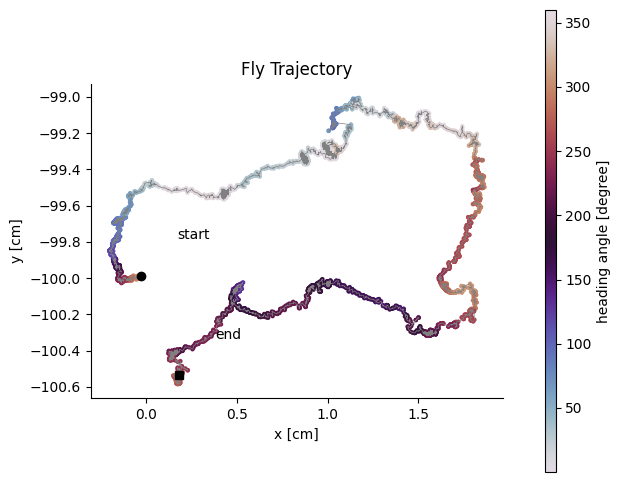

TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/TrajectoryPlot2.png


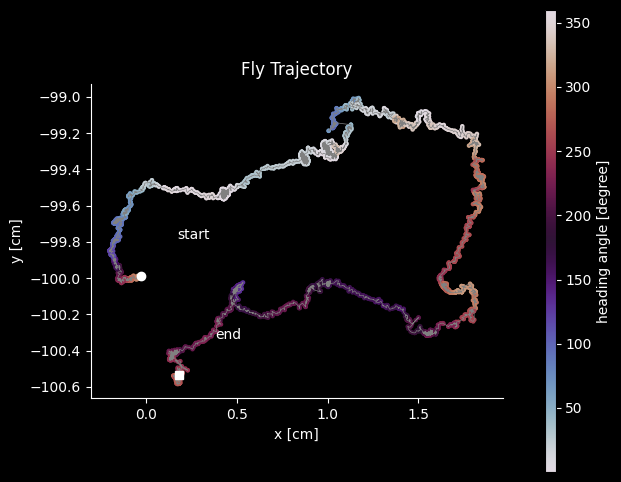

FlyHeading-0to360 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/FlyHeading-0to360.png


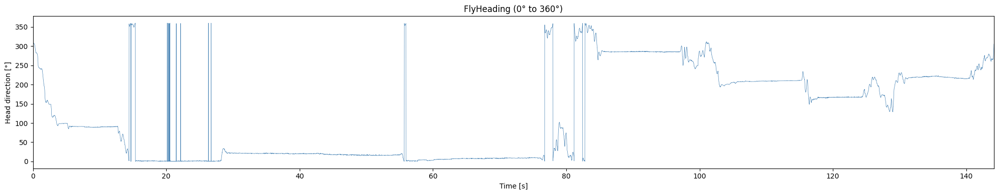

FlyHeading-180to+180 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/FlyHeading-180to+180.png


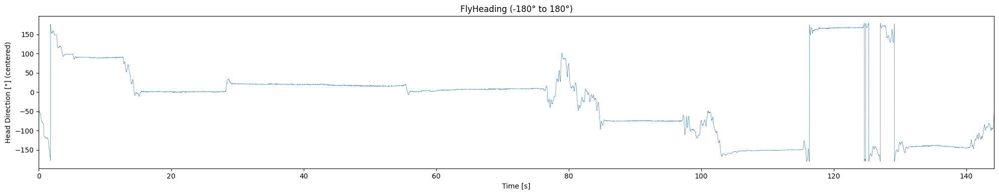

frame             time [s] filename shifts (px) angular_shift (deg)
    1                  0.0    1.png        -188               -45.0
    2 0.008372093023255813    2.png        -184  -43.95348837209302
    3 0.016744186046511626    3.png        -179 -42.906976744186046
    4  0.02511627906976744    4.png        -175 -41.860465116279066
    5  0.03348837209302325    5.png        -171  -40.81395348837209
StimulusOscillation saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/StimulusOscillation.png


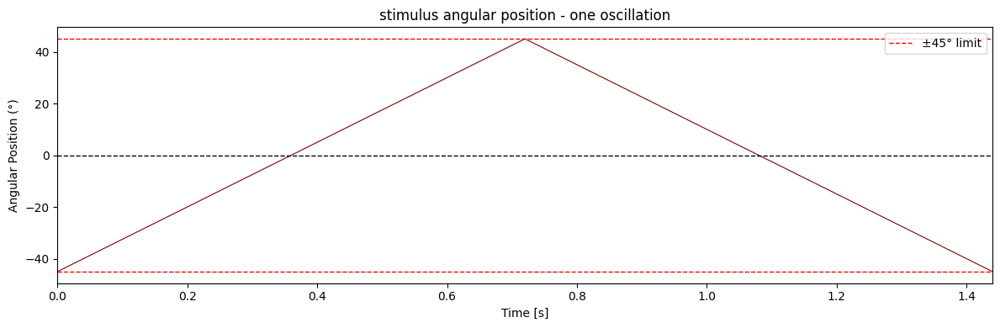

<class 'decimal.Decimal'>
0.008372093023255813
StimulusTimeSeries saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/StimulusTimeSeries.png


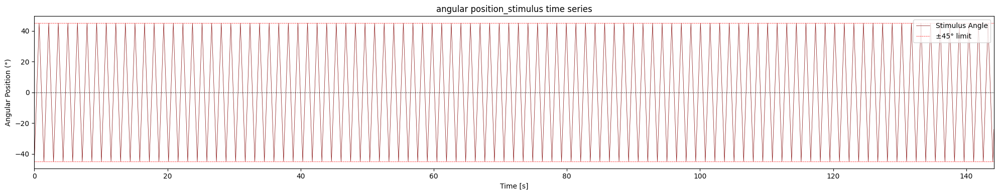

stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/stimulus angular velocity_raw.png


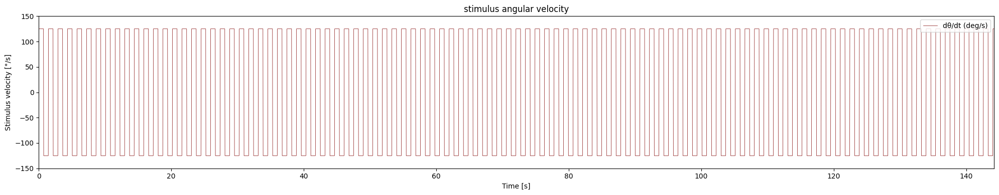

Heading vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/Heading vs stimulus position.png


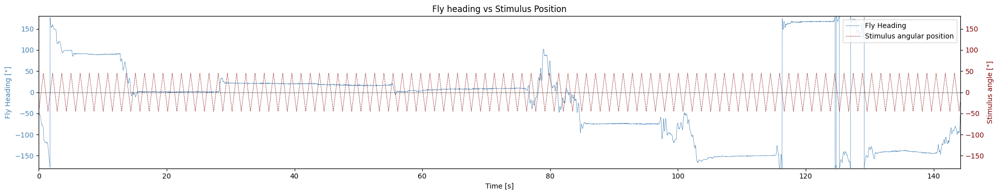

fly angular velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/fly angular velocity_raw.png


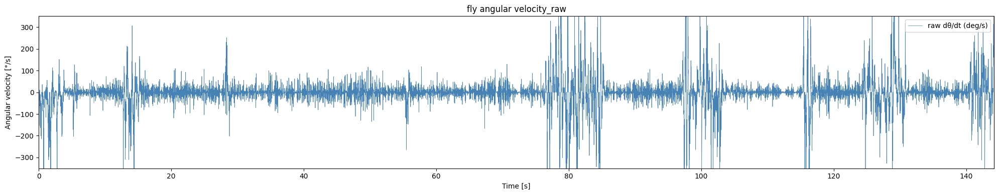

fly angular velocity_raw and smoothed saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/fly angular velocity_raw and smoothed.png


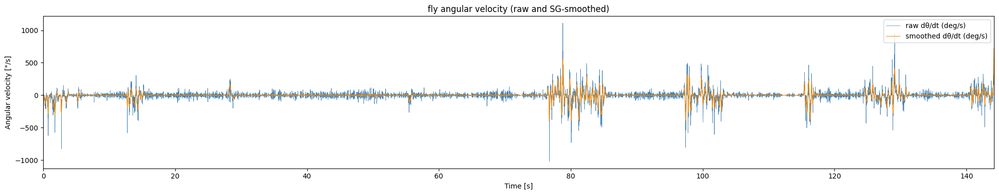

fly angular velocity vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/B/fly angular velocity vs stimulus position.png


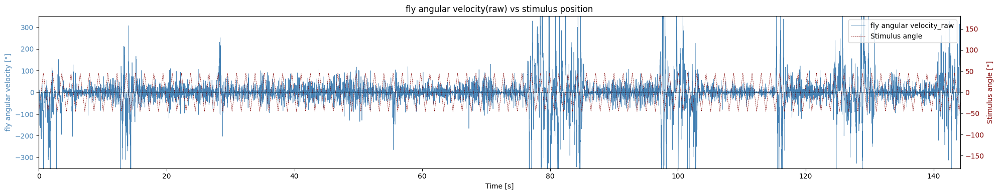

fly angular velocity_smoothed vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/fly angular velocity_smoothed vs stimulus position.png


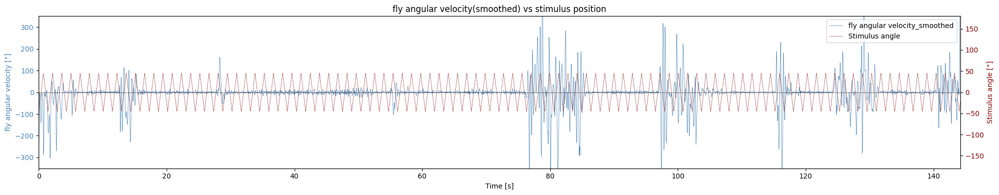

fly angular velocity_smoothed vs stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/fly angular velocity_smoothed vs stimulus velocity.png


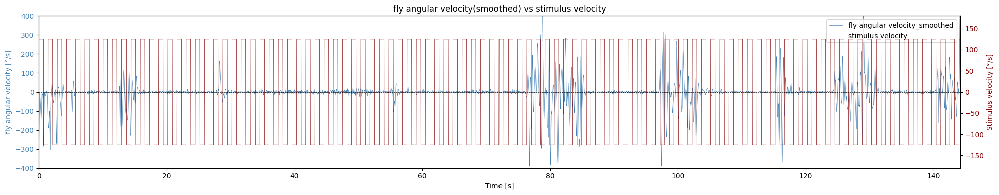

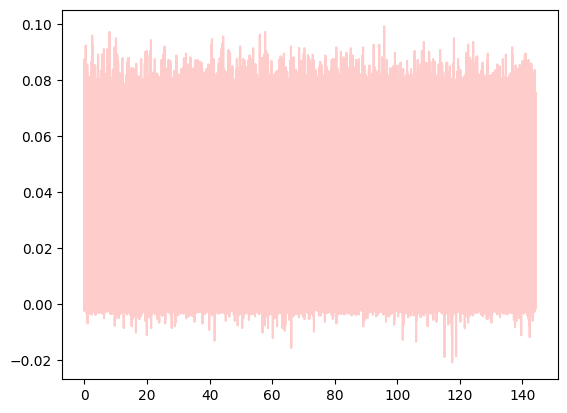

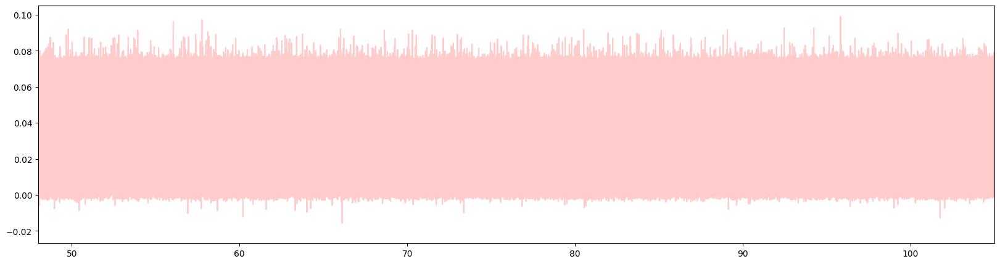

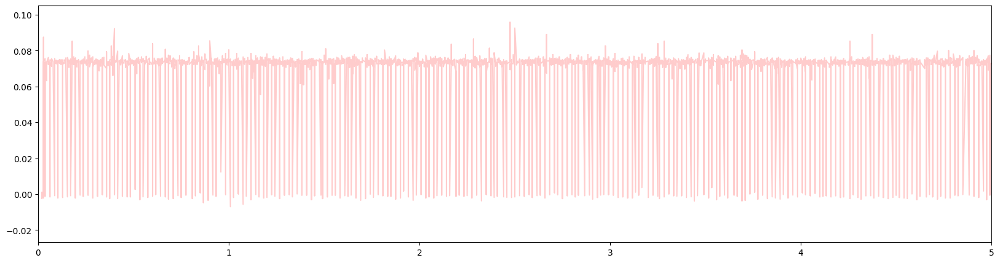

0.00–144.17  OFF
angular velocity vs stimulus angle with LED protocol saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/angular velocity vs stimulus angle with LED protocol.png


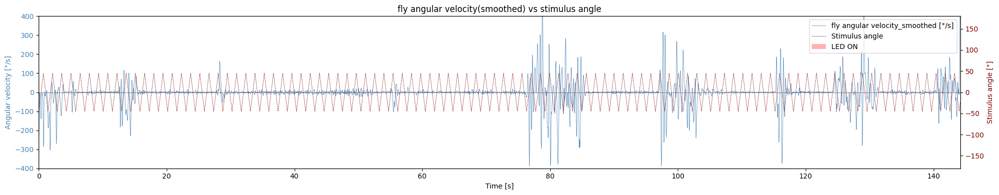

fly angular velocity_smoothed vs stimulus velocity with LED signal saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/fly angular velocity_smoothed vs stimulus velocity with LED signal.png


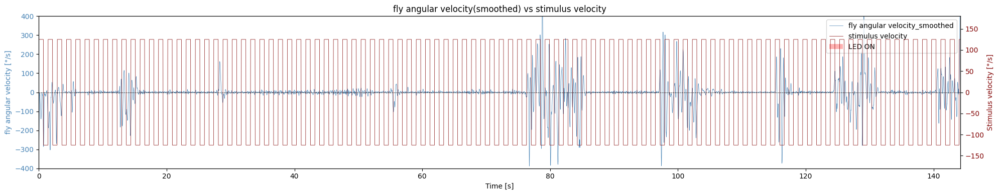

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:795: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


TranslationalVelocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/TranslationalVelocity.png


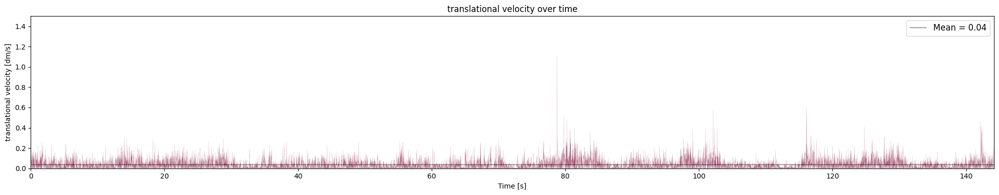

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:837: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/final plot.png


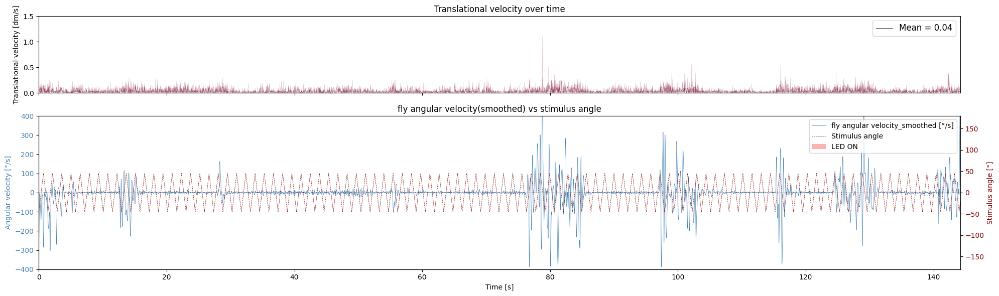

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:910: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/final plot2.png


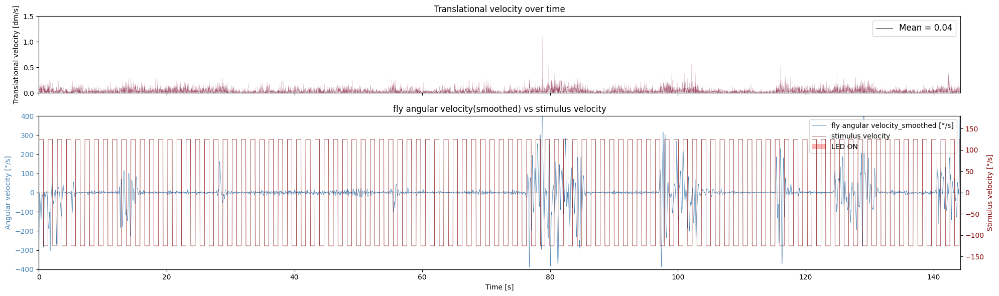

✅ Done: Fly_0011/B → /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/B/final plot2.png
correcting for Unity angle convention.
TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/TrajectoryPlot.png


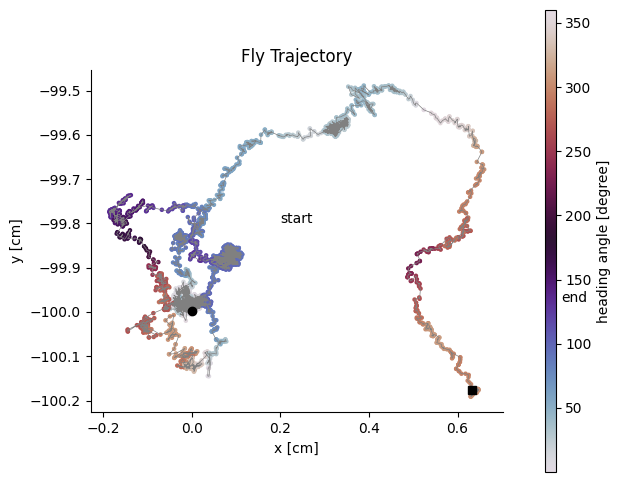

TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/TrajectoryPlot2.png


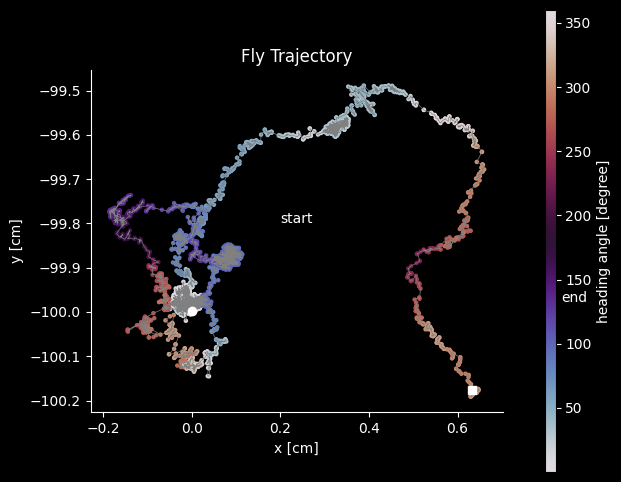

FlyHeading-0to360 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/FlyHeading-0to360.png


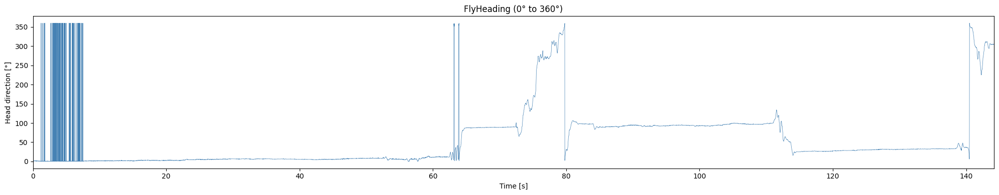

FlyHeading-180to+180 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/FlyHeading-180to+180.png


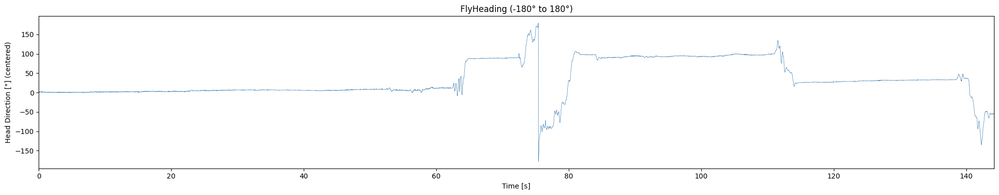

frame             time [s] filename shifts (px) angular_shift (deg)
    1                  0.0    1.png        -188               -45.0
    2 0.008372093023255813    2.png        -184  -43.95348837209302
    3 0.016744186046511626    3.png        -179 -42.906976744186046
    4  0.02511627906976744    4.png        -175 -41.860465116279066
    5  0.03348837209302325    5.png        -171  -40.81395348837209
StimulusOscillation saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/StimulusOscillation.png


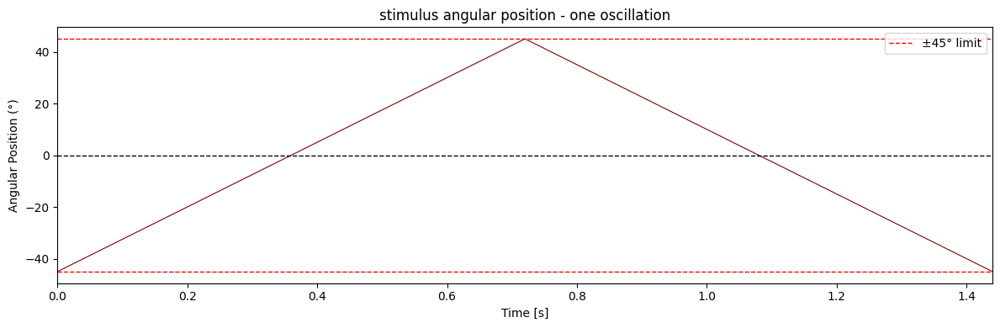

<class 'decimal.Decimal'>
0.008372093023255813
StimulusTimeSeries saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/StimulusTimeSeries.png


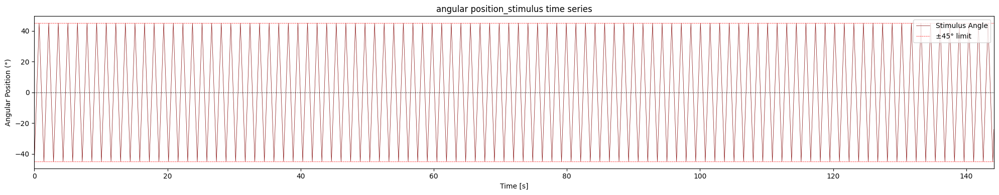

stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/stimulus angular velocity_raw.png


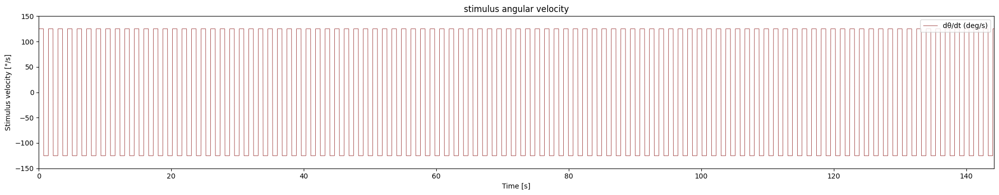

Heading vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/Heading vs stimulus position.png


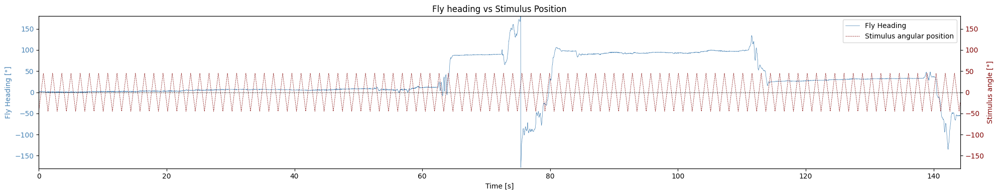

fly angular velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/fly angular velocity_raw.png


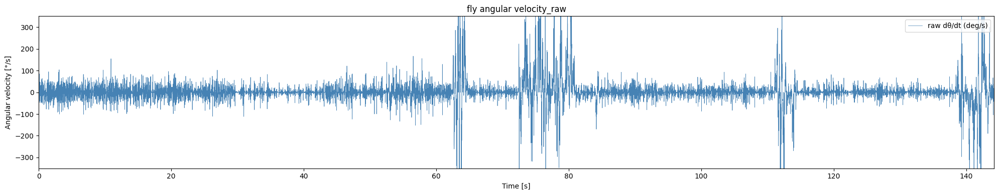

fly angular velocity_raw and smoothed saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/fly angular velocity_raw and smoothed.png


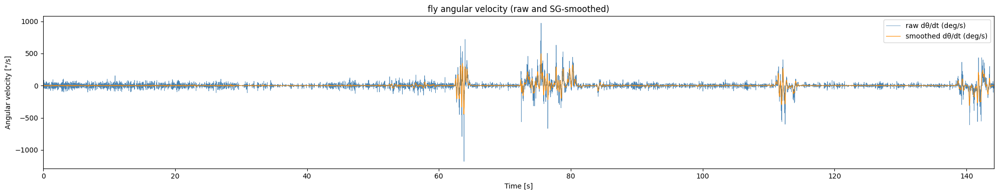

fly angular velocity vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/C/fly angular velocity vs stimulus position.png


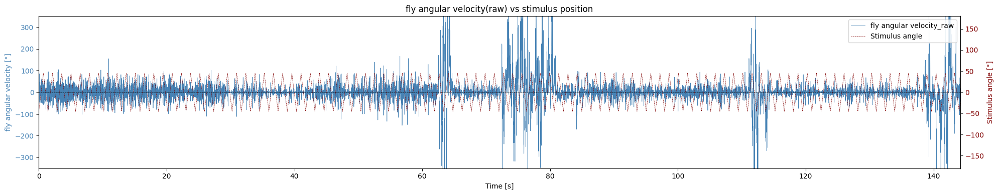

fly angular velocity_smoothed vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/fly angular velocity_smoothed vs stimulus position.png


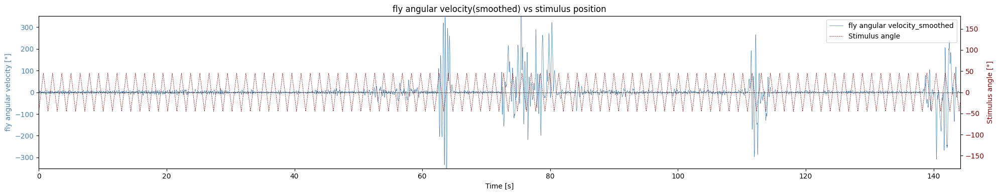

fly angular velocity_smoothed vs stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/fly angular velocity_smoothed vs stimulus velocity.png


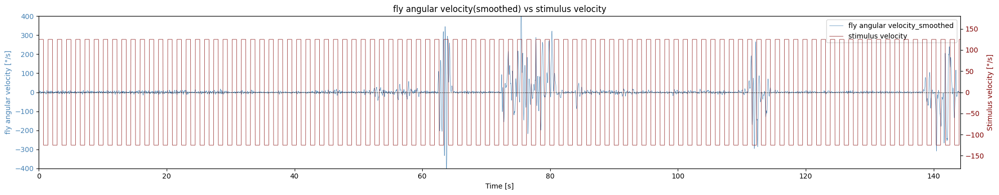

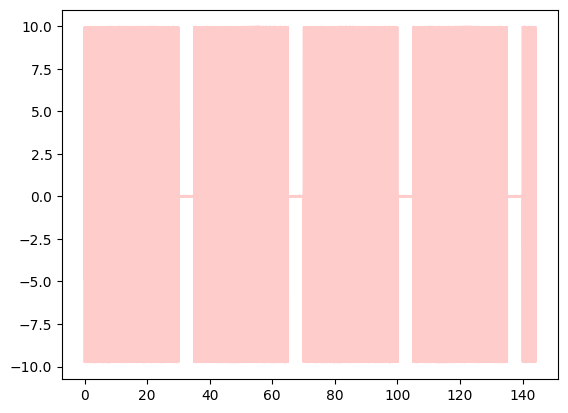

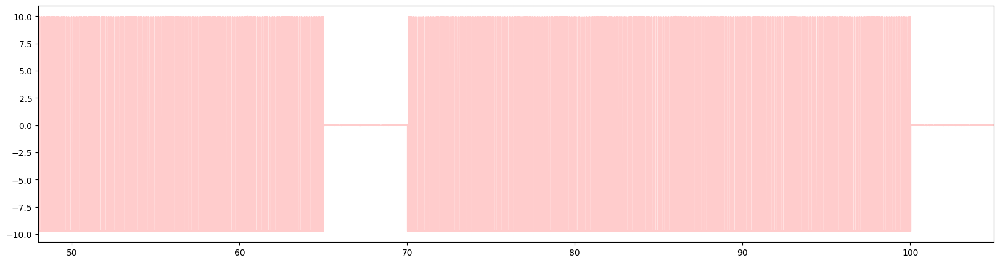

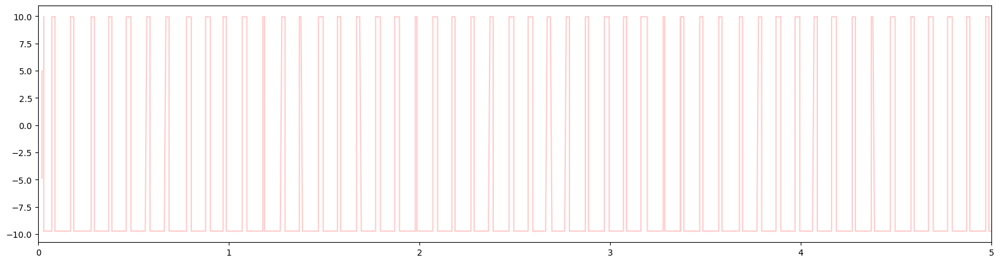

0.00–0.03  OFF
0.03–30.00  ON
30.00–35.08  OFF
35.08–65.00  ON
65.00–70.07  OFF
70.07–100.00  ON
100.00–105.08  OFF
105.08–135.00  ON
135.00–140.07  OFF
140.07–144.17  ON
angular velocity vs stimulus angle with LED protocol saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/angular velocity vs stimulus angle with LED protocol.png


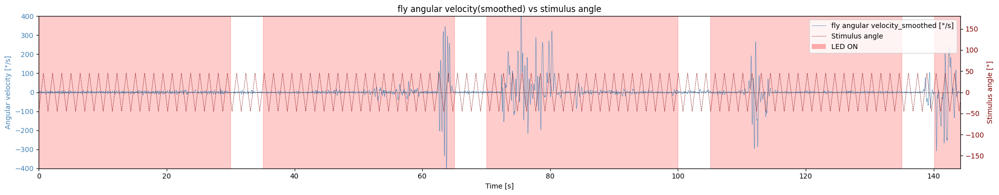

fly angular velocity_smoothed vs stimulus velocity with LED signal saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/fly angular velocity_smoothed vs stimulus velocity with LED signal.png


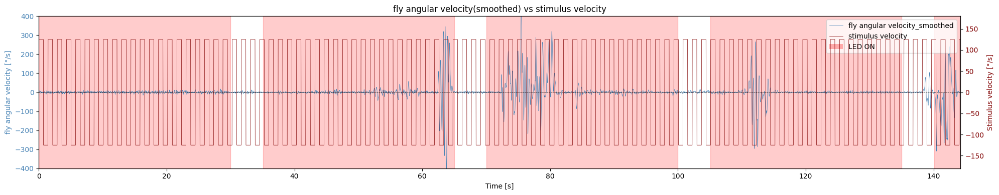

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:795: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


TranslationalVelocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/TranslationalVelocity.png


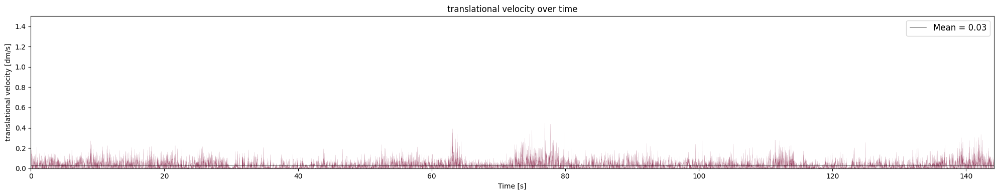

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:837: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/final plot.png


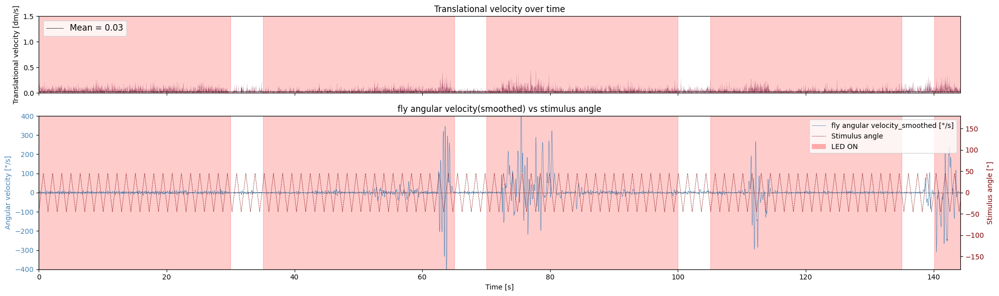

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:910: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/final plot2.png


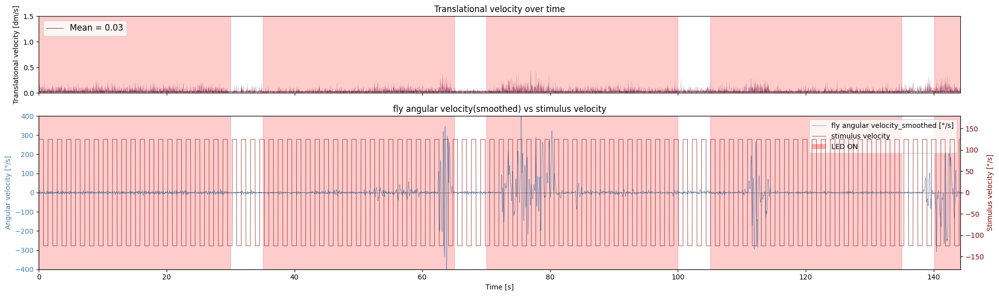

✅ Done: Fly_0011/C → /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/C/final plot2.png
correcting for Unity angle convention.
TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/TrajectoryPlot.png


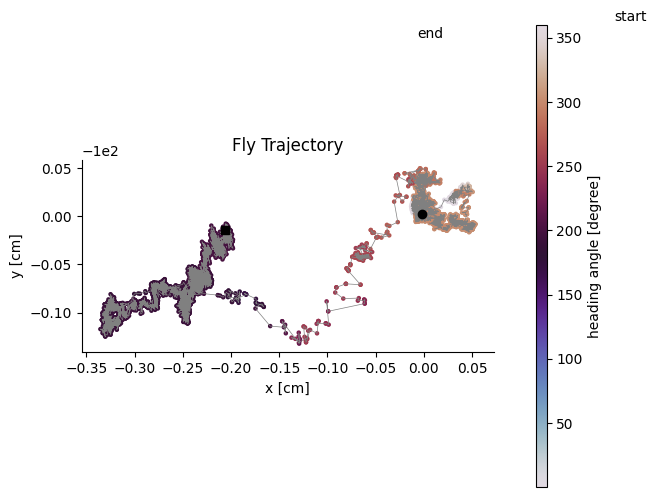

TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/TrajectoryPlot2.png


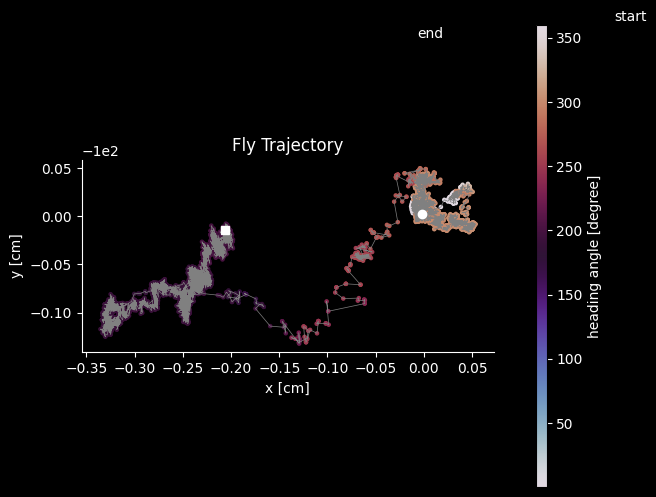

FlyHeading-0to360 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/FlyHeading-0to360.png


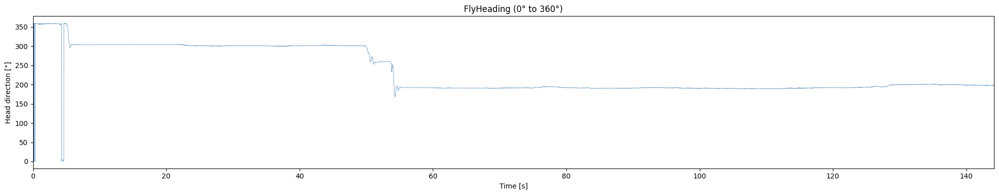

FlyHeading-180to+180 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/FlyHeading-180to+180.png


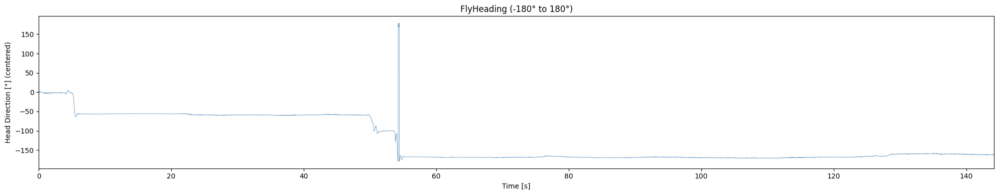

frame             time [s] filename shifts (px) angular_shift (deg)
    1                  0.0    1.png        -188               -45.0
    2 0.008372093023255813    2.png        -184  -43.95348837209302
    3 0.016744186046511626    3.png        -179 -42.906976744186046
    4  0.02511627906976744    4.png        -175 -41.860465116279066
    5  0.03348837209302325    5.png        -171  -40.81395348837209
StimulusOscillation saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/StimulusOscillation.png


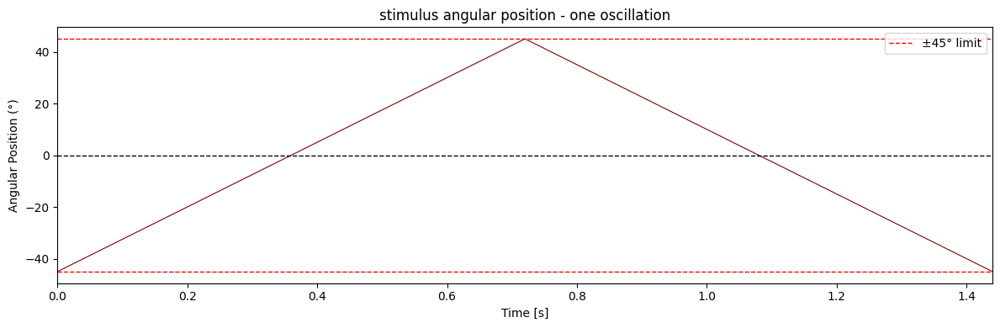

<class 'decimal.Decimal'>
0.008372093023255813
StimulusTimeSeries saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/StimulusTimeSeries.png


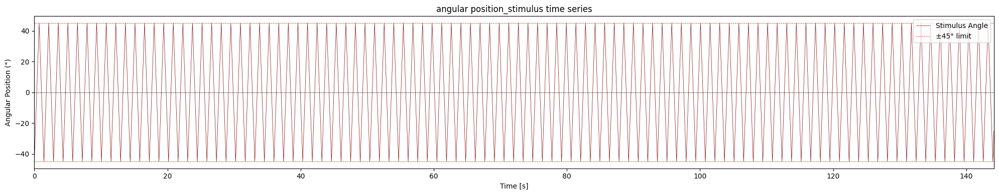

stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/stimulus angular velocity_raw.png


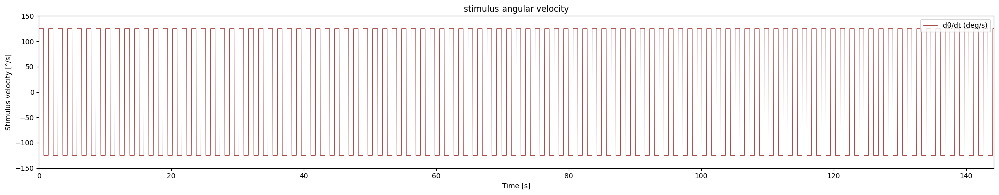

Heading vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/Heading vs stimulus position.png


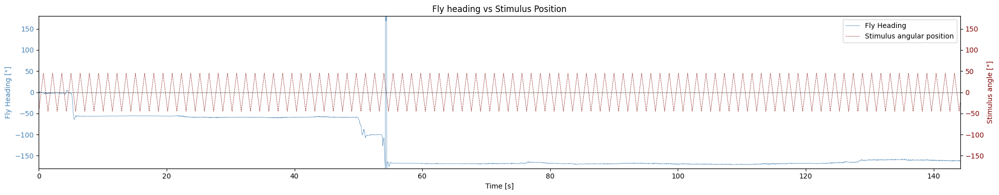

fly angular velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/fly angular velocity_raw.png


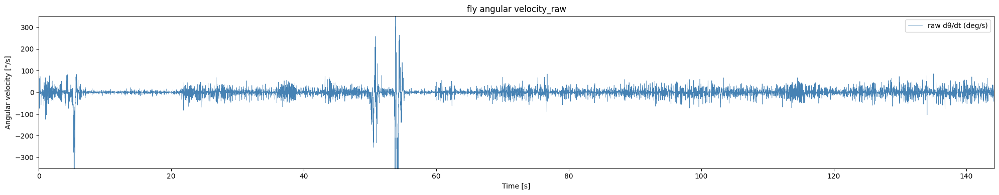

fly angular velocity_raw and smoothed saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/fly angular velocity_raw and smoothed.png


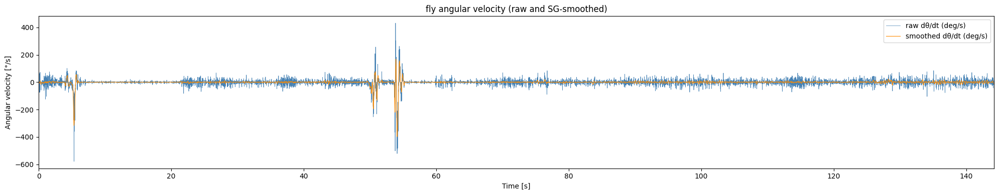

fly angular velocity vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/D/fly angular velocity vs stimulus position.png


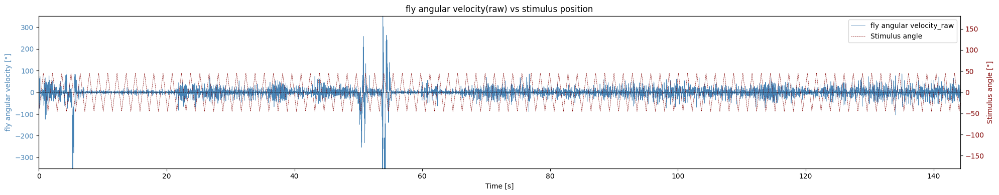

fly angular velocity_smoothed vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/fly angular velocity_smoothed vs stimulus position.png


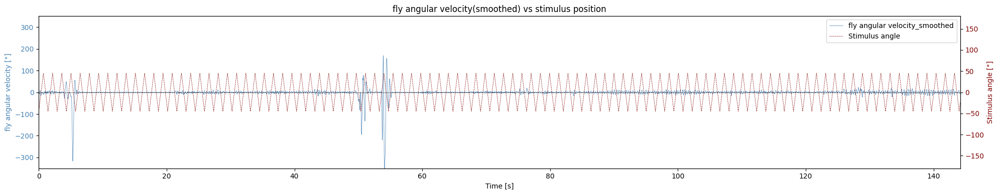

fly angular velocity_smoothed vs stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/fly angular velocity_smoothed vs stimulus velocity.png


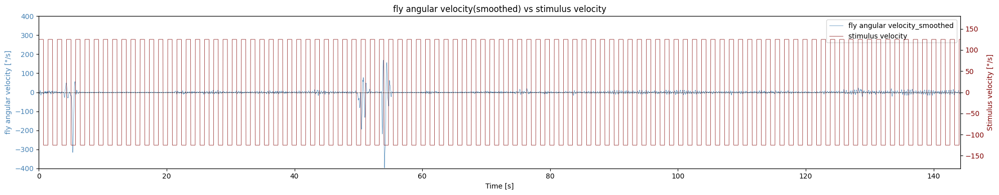

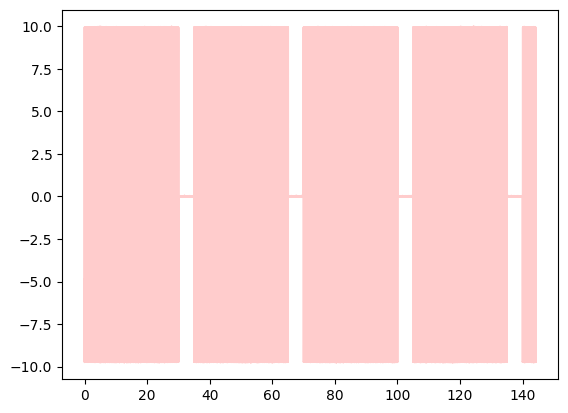

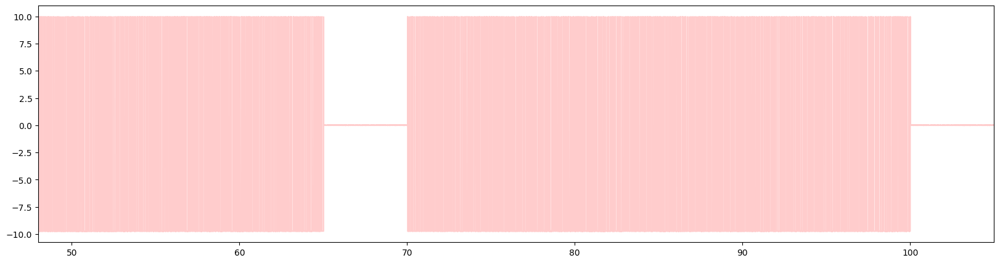

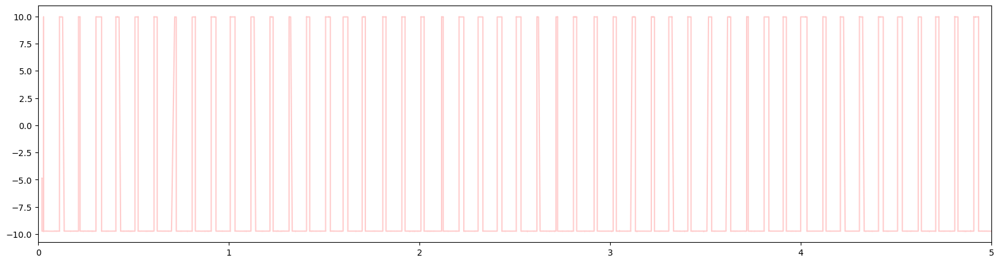

0.00–0.03  OFF
0.03–29.93  ON
29.93–35.02  OFF
35.02–65.02  ON
65.02–70.02  OFF
70.02–100.02  ON
100.02–105.03  OFF
105.03–135.03  ON
135.03–140.12  OFF
140.12–144.14  ON
144.14–144.17  OFF
angular velocity vs stimulus angle with LED protocol saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/angular velocity vs stimulus angle with LED protocol.png


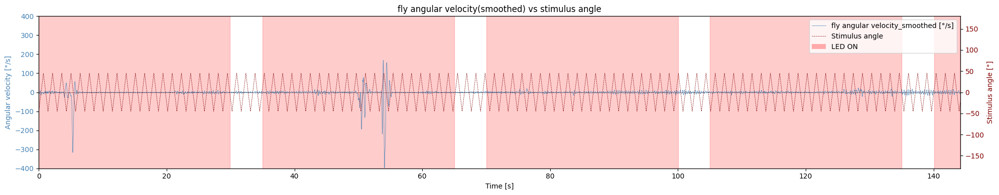

fly angular velocity_smoothed vs stimulus velocity with LED signal saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/fly angular velocity_smoothed vs stimulus velocity with LED signal.png


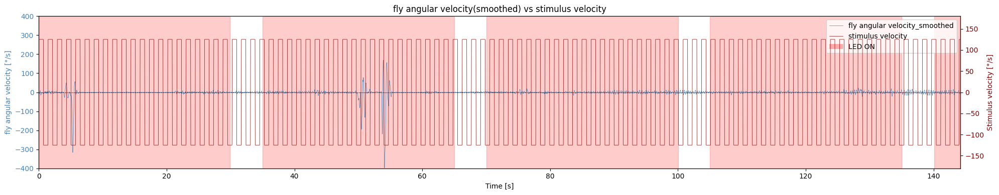

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:795: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


TranslationalVelocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/TranslationalVelocity.png


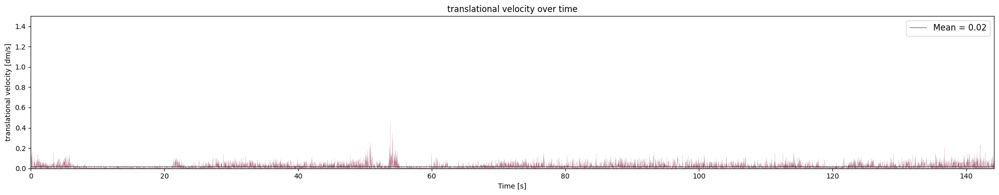

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:837: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/final plot.png


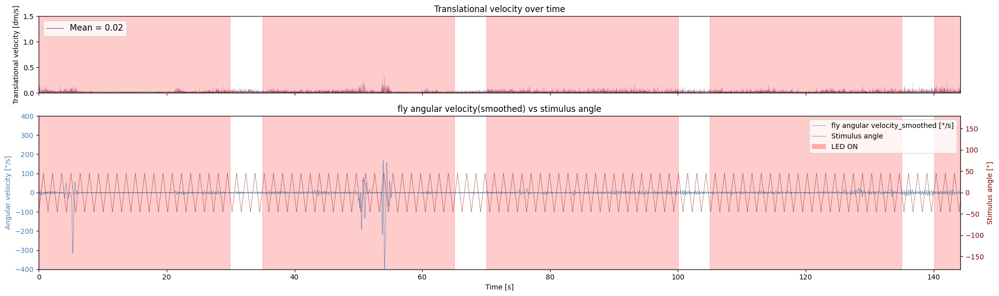

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:910: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/final plot2.png


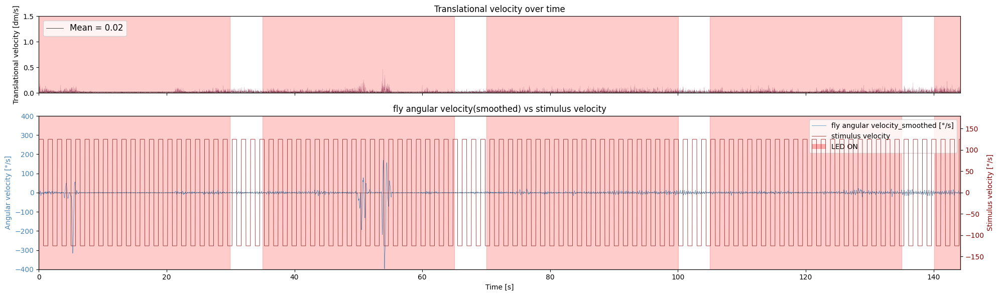

✅ Done: Fly_0011/D → /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/D/final plot2.png
correcting for Unity angle convention.
TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/TrajectoryPlot.png


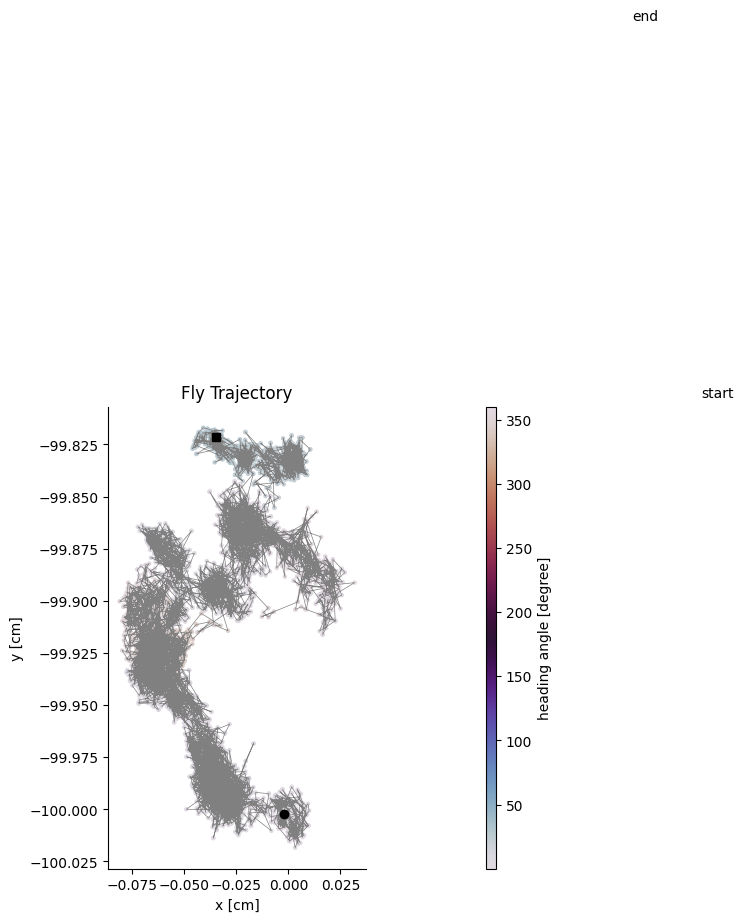

TrajectoryPlot saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/TrajectoryPlot2.png


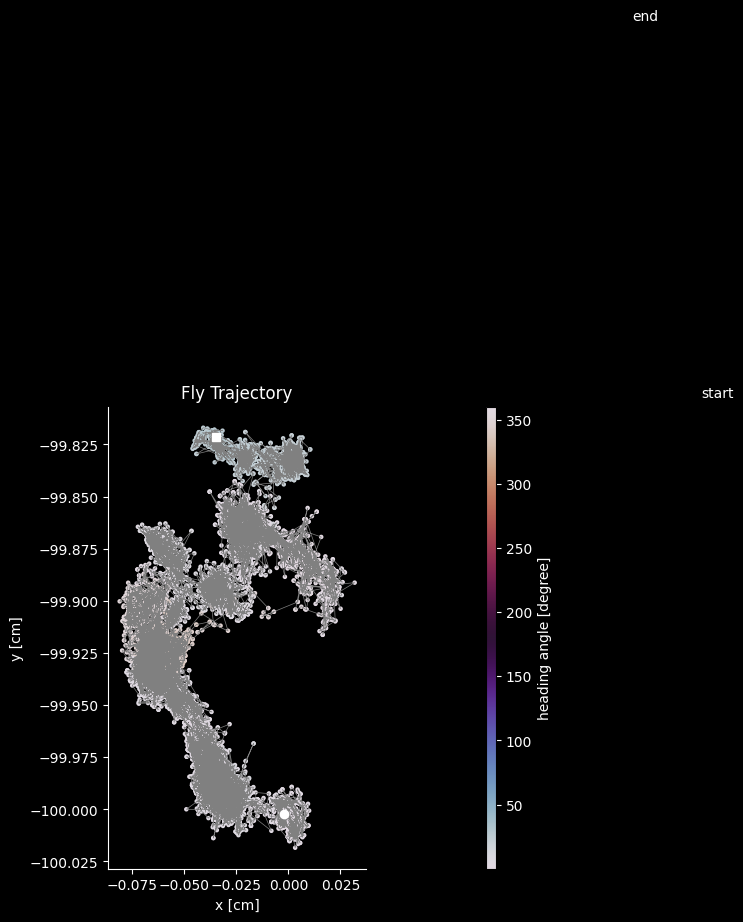

FlyHeading-0to360 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/FlyHeading-0to360.png


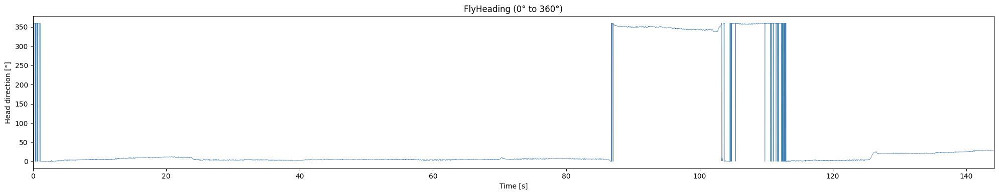

FlyHeading-180to+180 saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/FlyHeading-180to+180.png


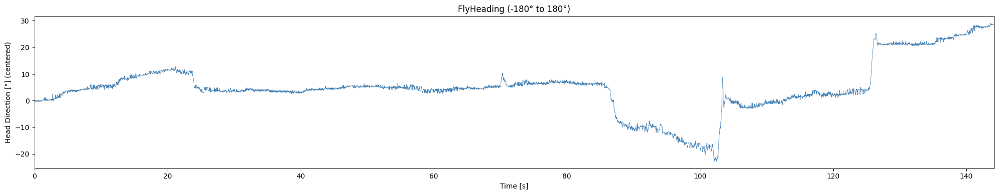

frame             time [s] filename shifts (px) angular_shift (deg)
    1                  0.0    1.png        -188               -45.0
    2 0.008372093023255813    2.png        -184  -43.95348837209302
    3 0.016744186046511626    3.png        -179 -42.906976744186046
    4  0.02511627906976744    4.png        -175 -41.860465116279066
    5  0.03348837209302325    5.png        -171  -40.81395348837209
StimulusOscillation saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/StimulusOscillation.png


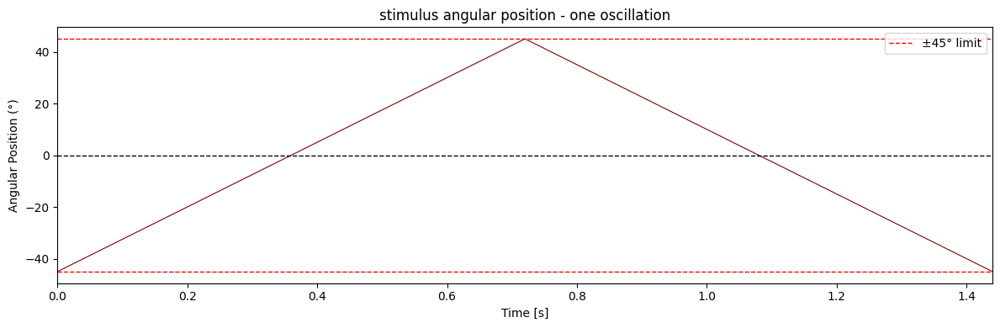

<class 'decimal.Decimal'>
0.008372093023255813
StimulusTimeSeries saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/StimulusTimeSeries.png


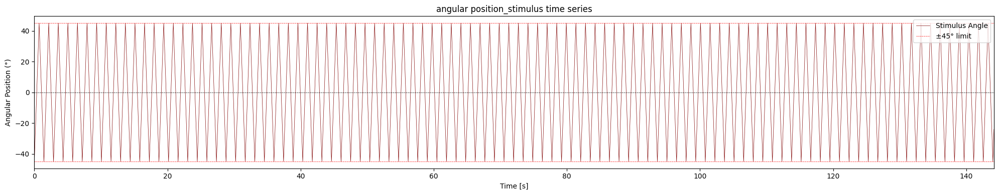

stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/stimulus angular velocity_raw.png


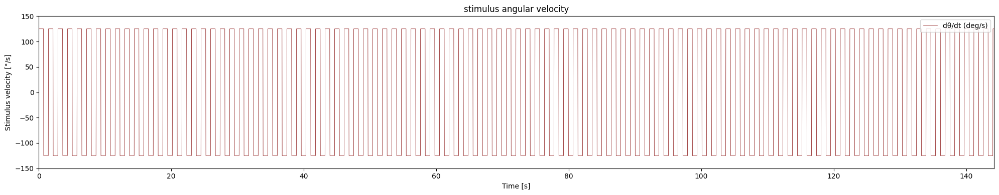

Heading vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/Heading vs stimulus position.png


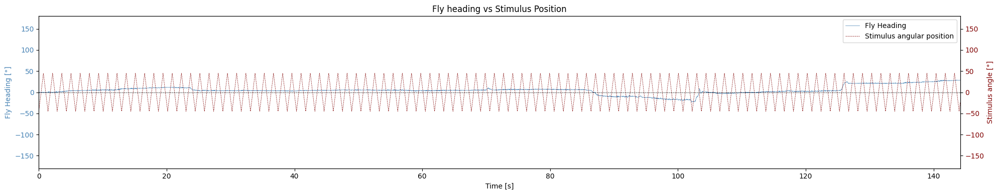

fly angular velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/fly angular velocity_raw.png


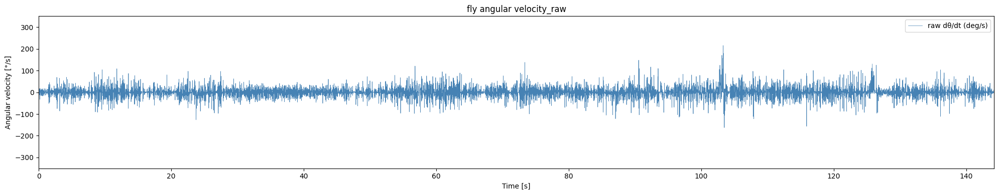

fly angular velocity_raw and smoothed saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/fly angular velocity_raw and smoothed.png


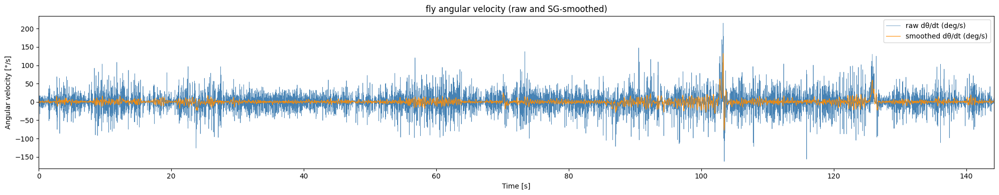

fly angular velocity vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/preproc/Fly_0011/E/fly angular velocity vs stimulus position.png


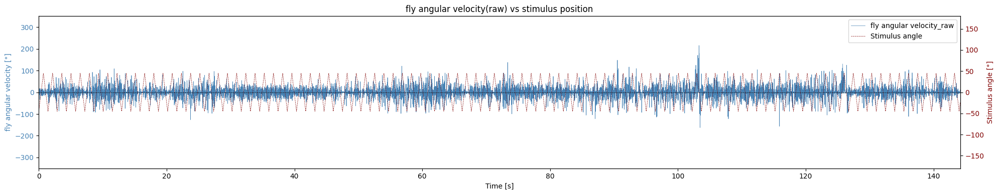

fly angular velocity_smoothed vs stimulus position saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/fly angular velocity_smoothed vs stimulus position.png


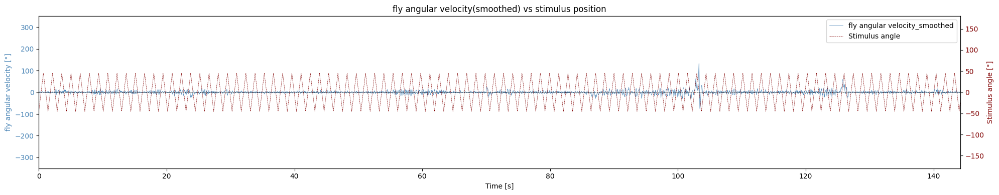

fly angular velocity_smoothed vs stimulus velocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/fly angular velocity_smoothed vs stimulus velocity.png


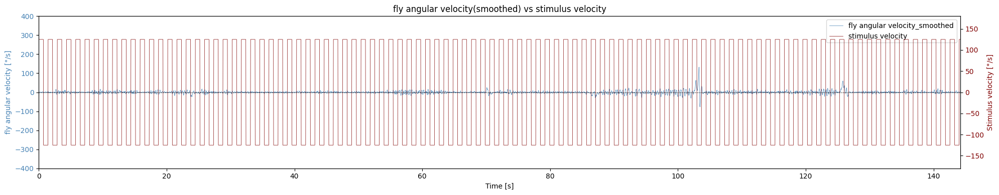

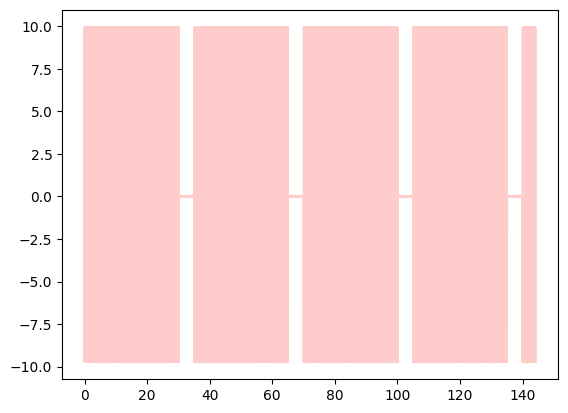

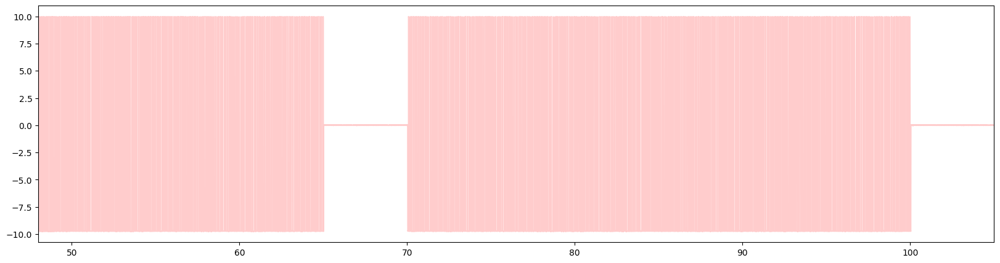

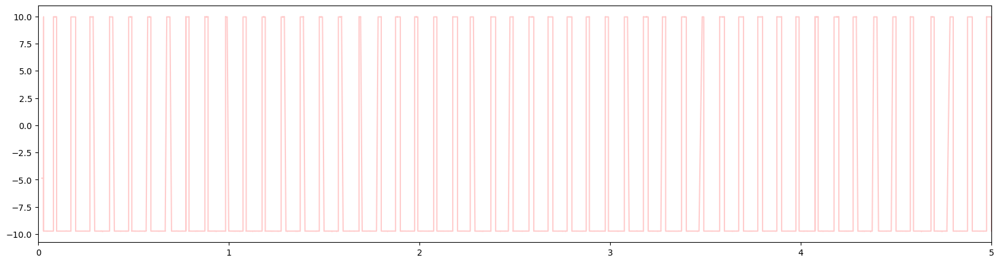

0.00–0.03  OFF
0.03–30.00  ON
30.00–35.08  OFF
35.08–65.00  ON
65.00–70.08  OFF
70.08–99.99  ON
99.99–105.08  OFF
105.08–135.00  ON
135.00–140.08  OFF
140.08–144.09  ON
144.09–144.17  OFF
angular velocity vs stimulus angle with LED protocol saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/angular velocity vs stimulus angle with LED protocol.png


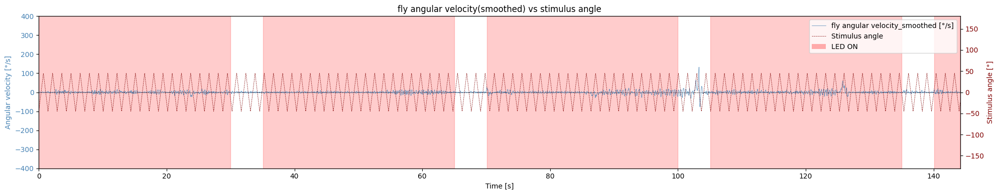

fly angular velocity_smoothed vs stimulus velocity with LED signal saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/fly angular velocity_smoothed vs stimulus velocity with LED signal.png


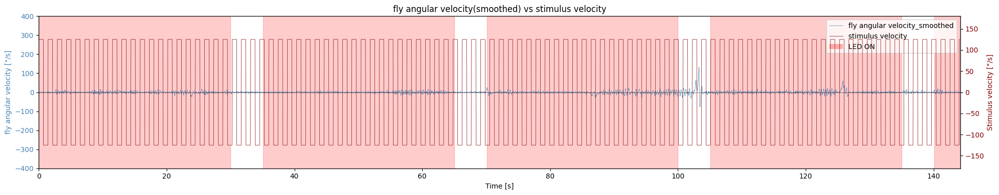

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:795: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


TranslationalVelocity saved to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/TranslationalVelocity.png


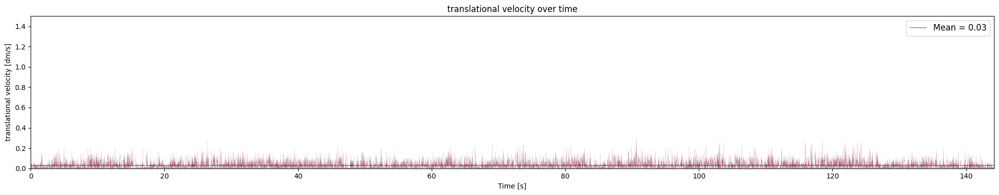

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:837: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/final plot.png


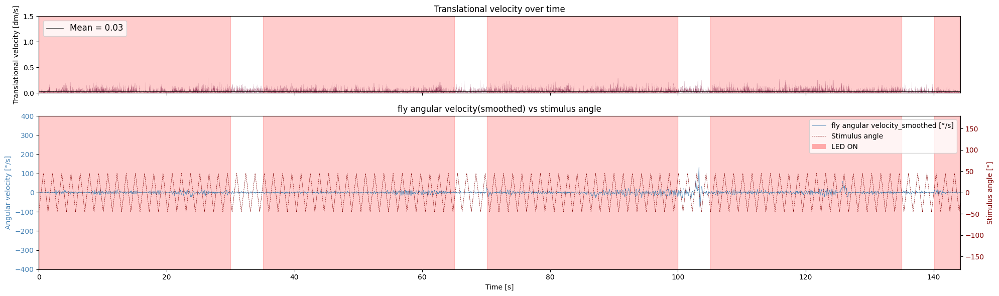

/var/folders/nz/36wz0cz90t34jt3ryz6_n08w0000gp/T/ipykernel_27351/3516971449.py:910: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('twilight')


Saved figure to: /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/final plot2.png


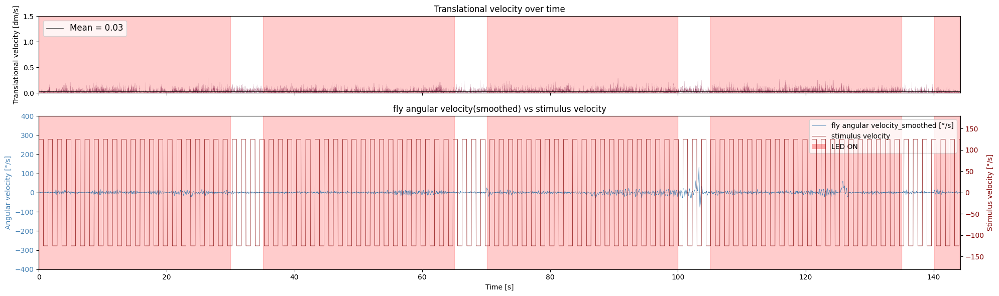

✅ Done: Fly_0011/E → /Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData/plot/Fly_0011/E/final plot2.png


In [5]:
# For few sub-folders
rootDir = '/Volumes/otopaliklab/Temporary_Storage/Aisha/ImagingData'
flyID = 'Fly_0011'

trial_folders = ['B', 'C', 'D', 'E']
#['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U']
# ['A1', 'B1', 'C1']

for trial_folder in trial_folders:
    run_analysis_for_trial(rootDir, flyID, trial_folder)